In [28]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML # Import HTML for displaying animations in Colab
from matplotlib.transforms import Affine2D
# Define the smaller rectangle's dimensions
small_rect_width = 0.5
small_rect_height = 0.25
xpoints=np.array([0,4,4,0,0])
ypoints=np.array([0,0,2,2,0])
#get the perimeter points of the larger rectangle that will represent the path
#these are the xpoints and ypoints defined previously
#in this case  path is (0,0) -> (4,0) -> (4,2) -> (0,2) -> (0,0)

# Create a figure and axis for the animation
fig, ax = plt.subplots()
ax.plot(xpoints, ypoints, 'b-', label='Path') # Plot the larger rectangle
ax.set_aspect('equal', adjustable='box')
ax.set_xlim([-1, 5])
ax.set_ylim([-1, 3])
ax.set_title('Robot moving along the path')
ax.grid(True)

#initialize the smaller rectangle (robot)
robot_x = [0, small_rect_width, small_rect_width, 0, 0]
robot_y = [0, 0, small_rect_height, small_rect_height, 0]
robot_patch = ax.fill(robot_x, robot_y, 'r', label='Robot')[0]

#define the path for the robot's reference point (e.g., bottom-left corner)
path_points = [
    (0, 0),         #start pt
    (4 - small_rect_width, 0), #move rightto next pt
    (4 - small_rect_width, 2 - small_rect_height),
    (0, 2 - small_rect_height),
    (0, 0)          #back to start pt
]

#number of frames for each segment of the path
frames_per_segment = 50

#total path points for smoother animation
def interpolate_path(points, numberof_frames_per_segment):
    interpolated_path = []
    for i in range(len(points) - 1):
        start_x, start_y = points[i]
        end_x, end_y = points[i+1]
        for j in range(numberof_frames_per_segment):
            t = j / numberof_frames_per_segment
            current_x = start_x + t * (end_x - start_x)
            current_y = start_y + t * (end_y - start_y)
            interpolated_path.append((current_x, current_y))
    interpolated_path.append(points[-1]) # Add the very last point
    return interpolated_path

full_path = interpolate_path(path_points, frames_per_segment)

def update(frame):
    #current position
    current_x, current_y = full_path[frame % len(full_path)]

    #update coordinates of robo
    new_robot_x = [current_x, current_x + small_rect_width, current_x + small_rect_width, current_x, current_x]
    new_robot_y = [current_y, current_y, current_y + small_rect_height, current_y + small_rect_height, current_y]

    robot_patch.set_xy(list(zip(new_robot_x, new_robot_y)))
    return robot_patch,

#animation
animation = FuncAnimation(fig, update, frames=len(full_path), interval=50, blit=True)

# Display the animation in Colab
plt.close(fig)
HTML(animation.to_jshtml())
##IMP- CLICK THE BUTTON TO START THE ANIMATION, IT DOESNT START ON OWN.

/tmp/ipython-input-385194106.py:8: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_coordinate, y_coordinates, degree)


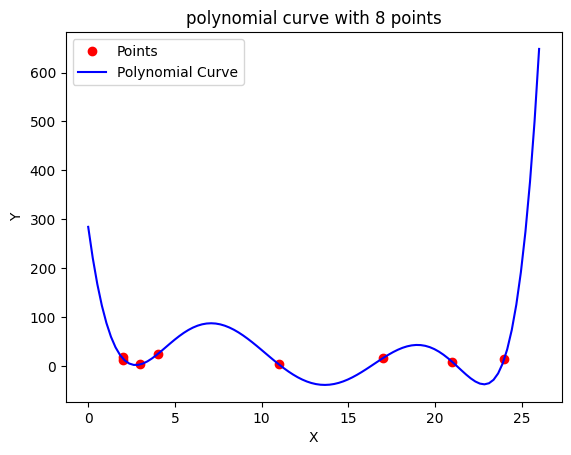

In [29]:
#part two of assignment- to genrate a polynomial curve with 8 points
x_coordinate = np.array([2,3,4,24,2,21,17,11])
y_coordinates = np.array([13,4,25,16,19,9,17,4])
#now to make a polynomial thru all these 3 points
#for N points, a polynomial of degree N-1 will pass through all points exactly.here we have 8 points, so we can fit a 7th degree polynomial.
degree = len(x_coordinate) - 1
#calculate polynomial coefficients
coefficients = np.polyfit(x_coordinate, y_coordinates, degree)
#create a polynomial function from the coefficients
polynomial = np.poly1d(coefficients)
#generate x values for the smooth curve
x_curve = np.linspace(min(x_coordinate) - 2, max(x_coordinate) + 2, 100)
#calculate corresponding y values
y_curve = polynomial(x_curve)
plt.plot(x_coordinate, y_coordinates, 'ro', label='Points')
plt.plot(x_curve, y_curve, 'b-', label='Polynomial Curve')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('polynomial curve with 8 points')
plt.legend()

/tmp/ipython-input-3122051100.py:14: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_coordinate, y_coordinates, degree)


First 5 x_curve values: [0.         0.26262626 0.52525253 0.78787879 1.05050505]
First 5 y_curve values: [284.9080493  221.32353193 168.08527589 124.17277338  88.61719087]


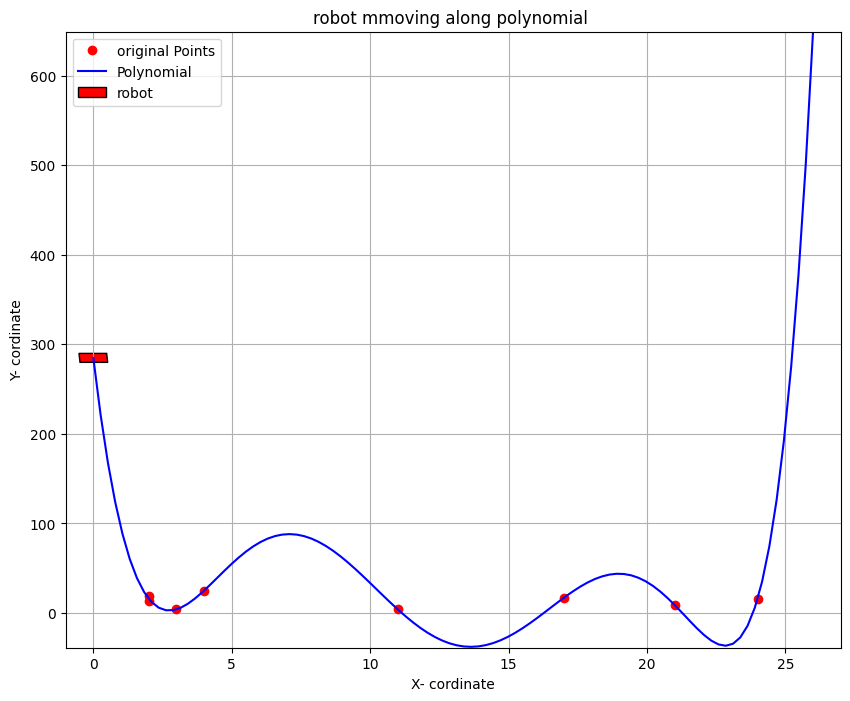

In [30]:
#part 3---- make robot follow the curve such that it faces the tangent to the curve.

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.transforms import Affine2D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

#define variables from the polynomial curve
x_coordinate = np.array([2,3,4,24,2,21,17,11])
y_coordinates = np.array([13,4,25,16,19,9,17,4])
degree = len(x_coordinate) - 1
coefficients = np.polyfit(x_coordinate, y_coordinates, degree)
polynomial = np.poly1d(coefficients)
x_curve = np.linspace(min(x_coordinate) - 2, max(x_coordinate) + 2, 100)
y_curve = polynomial(x_curve)

print("First 5 x_curve values:", x_curve[:5])
print("First 5 y_curve values:", y_curve[:5])
#print("Polynomial function is available:", polynomial is not None) #only for debugging
# derivative of the polynomial
derivative = np.poly1d(np.polyder(polynomial.c))

#the slopes (dy/dx) at each point on the curve
slopes = derivative(x_curve)

#the angles of the tangent lines (in radians)
angles = np.arctan2(slopes, 1) # arctan2(dy, dx), here dx is 1 for slope

#print("First 5 calculated slopes:", slopes[:5])
#print("First 5 calculated angles (radians):", angles[:5])
#only to check if this one is working

#deffine the robot's dimension.
robot_width = 10
robot_height = 1
#create a figure and an axis for the animation
fig, ax = plt.subplots(figsize=(10, 8))
#plot the original x_coordinate and y_coordinate points and the polynomial curve
ax.plot(x_coordinate, y_coordinates, 'ro', label='original Points')
ax.plot(x_curve, y_curve, 'b-', label='Polynomial')
# Get the initial position and angle for the robot
initial_x = x_curve[0]
initial_y = y_curve[0]
initial_angle = angles[0] # in radians
#define the robot's bottom-left corner so its center is at (initial_x, initial_y)
robot_rect_bl_x = initial_x - robot_width / 2
robot_rect_bl_y = initial_y - robot_height / 2
#Create a matplotlib.patches.Rectangle object to represent the robot, positioned at its initial location with its center at (initial_x, initial_y).
robot_patch = Rectangle((robot_rect_bl_x, robot_rect_bl_y), robot_width, robot_height,
                        fc='r', ec='k', label='robot')

#aadd the robot patch to the axes
ax.add_patch(robot_patch)
#Apply the initial rotation to the robot patch around its center (initial_x, initial_y).
#using Affine2D().rotate_around(cx, cy, angle_radians) as per matplotlib API. REFER matplotlib documentation of API
transform = Affine2D().rotate_around(initial_x, initial_y, initial_angle)
# Apply the combined transform to the robot patch.
# The transform operates on data coordinates, then ax.transData converts to display coordinates.
robot_patch.set_transform(transform + ax.transData)

#set the x and y axis limits---vv imp to maintain aspect ratio
ax.set_xlim(min(x_curve) - 1, max(x_curve) + 1)
ax.set_ylim(min(y_curve) - 1, max(y_curve) + 1)
ax.set_title('robot mmoving along polynomial ')
ax.set_xlabel('X- cordinate')
ax.set_ylabel('Y- cordinate')
ax.legend()
ax.grid(True)

# Store robot_patch for later use in animation update function
# plt.show() # IMPPPP----Don't show plot immediately, as it's part of an animation setup. this line is only to check if plot is workinng

In [31]:
#new cell, same q continues
#runn prev cell b4

def update(frame):
    #retrieve the current x-coordinate, y-coordinate, and tangent angle
    current_x = x_curve[frame]
    current_y = y_curve[frame]
    current_angle = angles[frame]

    #calculate the bottom-left corner of the robot's rectangle
    #    The robot's center is at (current_x, current_y)
    robot_rect_bl_x = current_x - robot_width / 2
    robot_rect_bl_y = current_y - robot_height / 2

    #uppdate the robot's position using set_xy
    #    This sets the bottom-left corner of the patch
    robot_patch.set_xy((robot_rect_bl_x, robot_rect_bl_y))

    #create a new Affine2D transformation for rotation around the robot's center
    #    The rotation is applied around (current_x, current_y)
    transform = Affine2D().rotate_around(current_x, current_y, current_angle)

    #applying this new transformation to the robot patch
    #It's crucial to add ax.transData to ensure the transformation is applied correctly in data coordinates
    robot_patch.set_transform(transform + ax.transData)

    #update function should return an iterable containing the robot_patch
    return (robot_patch,)#KEEP THE COMMA

#create the animation
animation = FuncAnimation(fig, update, frames=len(x_curve), interval=50, blit=True)

#display the animation in Colab
plt.close(fig) #IMPPPP-Close the static plot to prevent it from showing before animation. nahi toh output overlapp hoga.
HTML(animation.to_jshtml())

#imp to note---- the robot rectangle might change shape. this is because rotoation along center to maintain tangential facement. it wont happen in real life,
#this happend due to some bug in mathematical modelling of the rectangle i have used which i am not able to figure out.
